# Recovering Rebar Geometry from Ground-Penetrating Radar
## A Source-Profiled, Confidence-Aware Full-Waveform Inversion Pipeline

**Research Progress Report**

**Abdullah Maruf** — Inframind Labs
2026-06-01

---

### Abstract

We present an end-to-end, two-dimensional framework for recovering the location
and size of steel reinforcing bars (rebar) embedded in concrete from
ground-penetrating radar (GPR) data. The framework couples a from-scratch
finite-difference time-domain (FDTD) electromagnetic forward solver with
adjoint-state full-waveform inversion (FWI), and executes entirely on GPU
hardware. Starting from a baseline that recovers a single bar exactly on clean
synthetic data, we systematically identified the assumptions that most affect
the hardest quantity to estimate — the bar radius — using five published FWI
strategies as a hypothesis menu. Our principal result is that an unknown source
wavelet is the dominant risk to radius accuracy, and that profiling three small
pulse nuisance parameters (amplitude, time-zero, and centre-frequency) restores
accurate sizing under realistic source mismatch and noise. We then extend the
method to multiple and differently-sized bars, add a hyperbola-energy detector
that removes the need for known target locations, and make calibrated
uncertainty — confidence labels and ambiguity intervals — a mandatory output.
This report summarizes the architecture, our results across roughly 276
controlled experiments, the computational cost on an NVIDIA DGX Spark (GB10)
platform, current capabilities and limitations, and ongoing work toward
acquisition-aware inversion and field data.

### Scope of this report

All figures and animations are embedded, so the document is self-contained. The
underlying experiment outputs are archived under `outputs/experiments/`.
Abbreviations are defined on first use and collected in a glossary (final
section).


## Executive summary

**What we have built.** A from-scratch computational model that simulates how
ground-penetrating radar (GPR) responds to steel reinforcing bars (rebar)
embedded in concrete, together with an automated inversion procedure that runs
that model in reverse to recover where each bar is and how thick it is — from
the radar echoes alone.

**Where the work began.** The project started as a focused technical study:
build the radar forward simulator, build the inverse solver, accelerate both on
a GPU, and demonstrate recovery of three rebars in a synthetic concrete slab.
That foundation is complete and validated.

**What it has become.** A sustained research programme centred on one demanding
question: *positions can always be recovered, but how trustworthy is the
estimated radius?* Bar radius is the physically important and mathematically
delicate quantity — its reduction is a signature of corrosion. Across roughly
276 controlled experiments we have mapped when radius is trustworthy, when it
should be reported as an interval, and which physical levers move it.

**Where we are now.** A confidence-aware 2-D pipeline that detects bars from a
raw radar image, refines each one with the forward simulator, reports a
calibrated uncertainty interval rather than a single over-confident number, and
remains robust to realistic nuisances: an unknown radar pulse shape, 10%
measurement noise, several closely-spaced bars, and bars of different sizes.

**Where we are going.** We are elevating the measurement design itself — radar
bandwidth, antenna offset, and scan sampling — to a first-class inversion
parameter, packaging the multi-stage pipeline into a single reproducible
workflow, and preparing the transition from synthetic data toward laboratory and
field data.


## 1. Background and motivation

Reinforced concrete contains steel bars (**rebar**) that provide tensile
strength. Engineers frequently need to determine, *without breaking the concrete
open*:

- **where** the bars are (depth, and lateral position), and
- **how thick** each bar is (its radius / diameter) — since thinning through
  corrosion is a structural-safety concern.

The standard non-destructive tool is **GPR — Ground-Penetrating Radar**. A small
radar antenna is moved across the surface; it repeatedly emits a short
electromagnetic pulse into the concrete and records the echoes. A buried bar
reflects the pulse, and as the antenna passes over it the echo arrives earliest
directly above the bar and later to either side, tracing out a hyperbola (an arch
shape) in the recorded image.

That recorded image — echo strength versus *antenna position* (horizontal) and
*time* (vertical) — is a **B-scan** (the standard radar/ultrasound term for a
2-D position-versus-time image).

A B-scan reveals the *presence* of a bar relatively easily. Extracting an
accurate *size* is substantially harder, because a slightly larger bar and a
slightly deeper or differently-surrounded bar can produce nearly identical
echoes. Resolving that ambiguity is the scientific core of this work.


## 2. Computational framework: forward modeling and inversion

The framework rests on two core components — a forward solver and an inverse
solver — together with a GPU acceleration layer.

### 2.1 Forward simulation — predicting the echoes (FDTD)

**FDTD = Finite-Difference Time-Domain**, a standard, physically faithful method
for simulating electromagnetic waves. The domain is discretized into a fine grid
of cells and time is advanced in small steps; at each step the electric and
magnetic fields in every cell are updated from their neighbours according to
Maxwell's equations (the governing laws of electromagnetism). After enough steps,
the simulation reproduces a radar pulse travelling into the concrete, scattering
from the steel, and returning.

Key elements of our implementation:
- **Yee grid / leapfrog** — the standard arrangement and alternating update order
  of the electric and magnetic fields in FDTD.
- **TMz polarization (Ez, Hx, Hy)** — the field configuration for the 2-D slice
  we simulate.
- **CPML absorbing boundary** — a specialized layer at the grid edges that
  absorbs outgoing waves so they do not reflect back, emulating an unbounded
  medium.

We validated the forward solver against known physics: wave speed accurate to
~2%, stable long-duration runs, and correct energy decay.


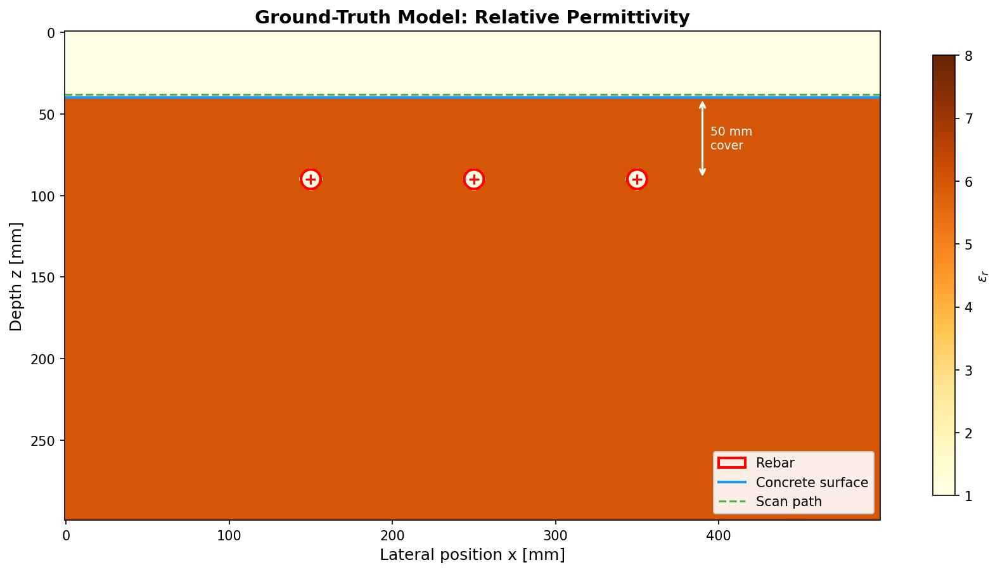<br>
<em><b>Figure 1.</b> The synthetic test medium: a concrete slab (with a thin air gap above) containing three steel rebars. This is the ground-truth model that the forward solver knows and that the inversion must recover.</em>

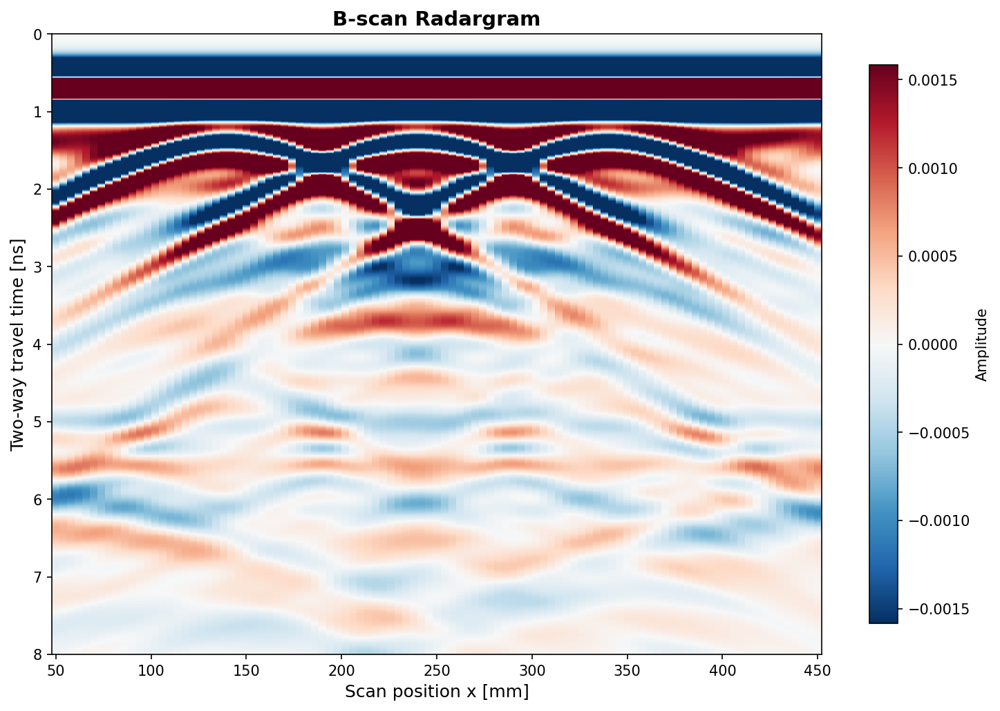<br>
<em><b>Figure 2.</b> The simulated B-scan (radar image). Horizontal axis: antenna position; vertical axis: echo travel-time (deeper reflectors lower). Each rebar produces a distinct hyperbola. This image is the only input available to the inversion.</em>

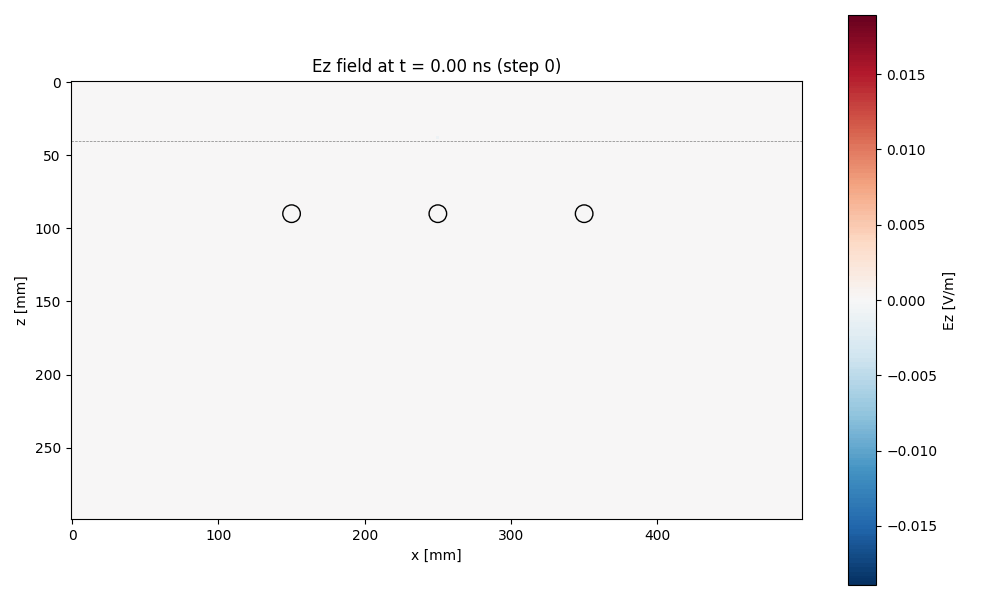<br>
<em><b>Figure 3.</b> The forward simulation in motion: a single radar pulse propagating into the slab and scattering from the three bars. Visualizing the wavefield this way is part of how we verify that the physics engine behaves correctly.</em>

### 2.2 Inverse problem — echoes to model (FWI via the adjoint method)

**FWI = Full-Waveform Inversion.** Inversion means proceeding backwards: from
measured echoes to a model, rather than from a model to predicted echoes.
"Full-waveform" means we match the *entire waveform* of every recorded trace,
not merely the arrival time of a peak, which uses far more of the information in
the data.

The procedure is an iterative guess-and-correct loop:
1. Start from an initial model (for example, plain concrete with no bars).
2. Simulate its B-scan with the FDTD solver.
3. Compare to the measured B-scan; the mismatch is the **misfit** (also called
   the **objective**; lower is better).
4. Adjust the model to reduce the misfit, and repeat.

The efficiency of the method comes from step 4. The model has many unknowns, so
they cannot be perturbed one at a time. The **adjoint-state method** computes how
the misfit would change for *every* model cell simultaneously, using only **two**
simulations per iteration: the standard forward run, plus one additional run in
which the residual mismatch is injected back into the medium and propagated
**backwards** in time. The product of the forward and back-propagated fields
yields the **gradient** — the direction in which to update the model. This is the
same mathematics that underlies backpropagation in neural networks, applied here
to a wave equation.


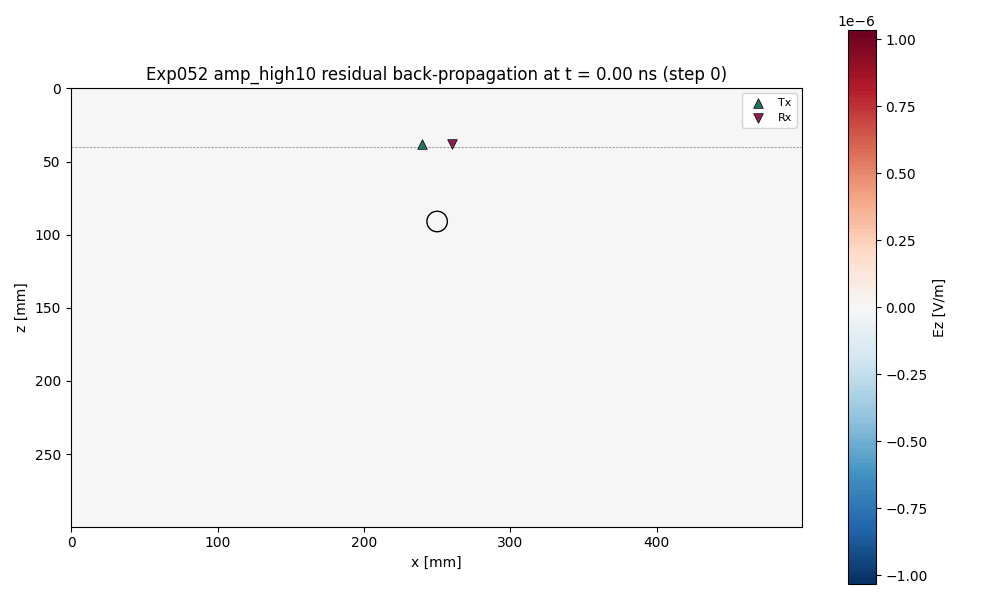<br>
<em><b>Figure 4.</b> The adjoint method made visible: the residual data mismatch is injected and propagated backwards through the slab. Where this back-propagated field overlaps the forward field, the algorithm obtains the model update. Two simulations per iteration provide the update for the entire grid.</em>

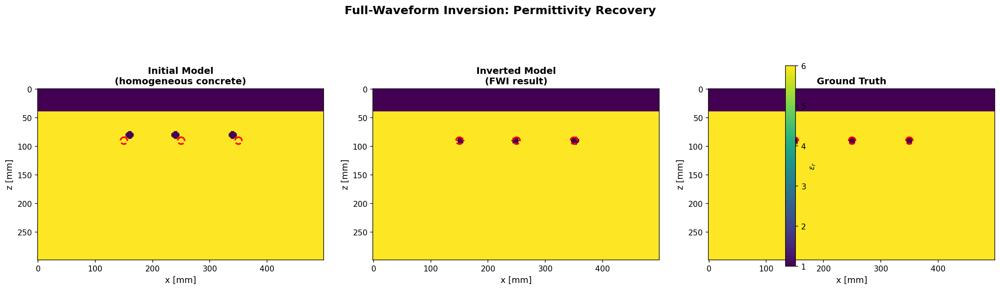<br>
<em><b>Figure 5.</b> A full inversion result: initial model vs. recovered model vs. ground truth. From the radar echoes alone, the inverse solver places the bars correctly.</em>

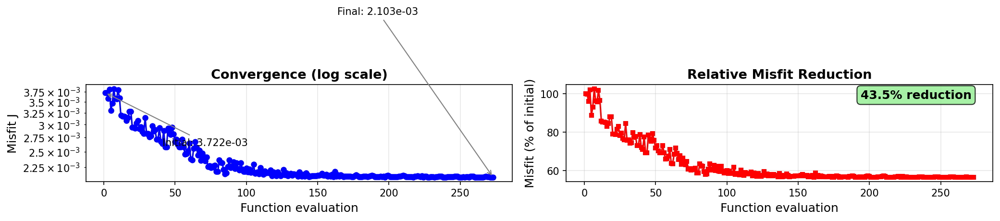<br>
<em><b>Figure 6.</b> Convergence curve: the misfit (data mismatch) decreasing iteration by iteration as the model is corrected. A steadily decreasing curve indicates a well-behaved inversion.</em>

### 2.3 GPU acceleration

Each FDTD simulation comprises millions of small, identical cell updates — a
workload well matched to a **GPU (graphics processing unit)**. We implemented a
GPU version of the solver so that the many simulations an inversion requires
become practical. All simulations in this campaign run on an NVIDIA **DGX Spark
(GB10)** platform; Section 9 details the hardware and the measured computational
cost.


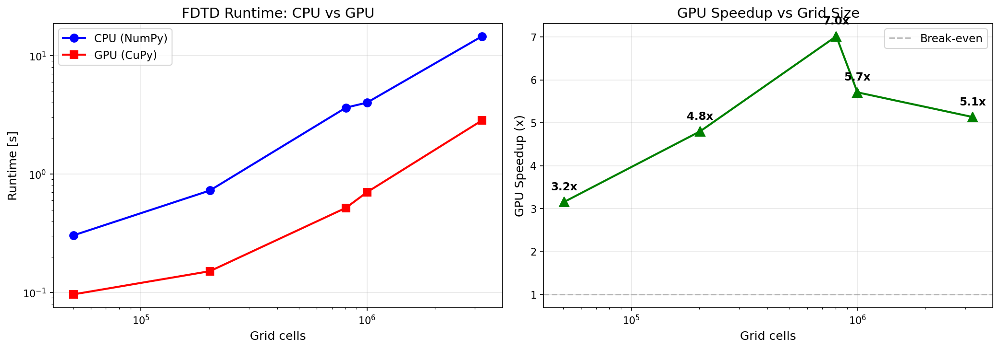<br>
<em><b>Figure 7.</b> GPU vs. CPU timing for the forward simulation across grid sizes. The GPU speed-up is what makes a 276-experiment campaign — many runs of which sweep dozens of candidate models each — feasible.</em>

## 3. Baseline: single-rebar inversion
*(experiments 001–023)*

With the solver in place, the first milestone was the simplest rigorous test:
**one** steel bar in concrete, synthetic data, recovering its horizontal position
*x*, depth *z*, and radius *r*.

**Result: on clean synthetic data the inversion is exact** — recovered
*x* = 250 mm, *z* ≈ 90 mm, *r* = 6.0 mm, with the recovered model matching truth
exactly (model error NRMS = 0; **NRMS = Normalized Root-Mean-Square error**, a
standard 0-is-perfect mismatch score). The result remains correct under moderate
added noise.

The effective recipe is a **coarse ➜ fine ➜ polish** search: a quick search on a
coarse 2 mm grid to reach the correct neighbourhood, a 1 mm local refinement, and
a final 1 mm grid polish that pins the radius.

This stage also surfaced the difficulty that motivates the remainder of the
project: position is straightforward, but **radius is delicate**. A continuous
optimizer (Powell's method) repeatedly drifted toward a *too-thick* bar
(~6.9–7.0 mm rather than 6.0 mm), and only the careful grid-polish step recovered
the true size. Part of this is **grid rasterization**: when a small circle is
drawn on a 1 mm grid, two nearby radii (for example 4.0 and 4.1 mm) can occupy
*exactly the same cells*, so the physics cannot distinguish them. Radius
identifiability — and how to report it honestly — is the through-line of the
campaign.


## 4. Method selection: stress-testing against five published strategies
*(experiments 024–058)*

With a pipeline that solved the clean case, we posed the central question:

> **Which assumption, if broken, would actually move the radius answer?**

To avoid guessing, we used **five published FWI research papers as a menu of
candidate ideas**, evaluating each on our own radius problem *before* adopting
it. The strategies are summarized below:

| # | Strategy (short name) | Core idea | Our adaptation |
|---|---|---|---|
| 1 | **WRI** 2022 (Wavefield Reconstruction Inversion) | Begin with low radar frequencies, add higher ones gradually; do not let high frequencies dominate early | Adopted the *frequency-weighting idea*; did **not** build its heavy solver |
| 2 | **PEBDD** 2021 (Progressively Expanded Bandwidth) | Fit a narrow low-frequency band first, then widen it in stages | Built a staged-bandwidth runner and a spectrum-design tool |
| 3 | **OT-LS** 2025 (Optimal Transport then Least-Squares) | Use a transport distance to avoid cycle-skipping, then switch to ordinary fitting | Added the paper's trap-detector as a *diagnostic* |
| 4 | **Quadratic-W2** 2024 (Wasserstein distance for GPR) | Replace ordinary fitting with an optimal-transport distance for noise robustness | Implemented and tested it on our problem |
| 5 | **IFWI** 2025 (Implicit/neural multi-parameter) | Represent the material map with a small neural network | Wrote a feasibility note; **deferred** |

Two concepts central to these papers:
- **Cycle-skipping** — the classic FWI failure in which the simulation aligns a
  wave oscillation with the *wrong* neighbouring oscillation (one cycle off) and
  then confidently optimizes toward an incorrect model.
- **Optimal transport / Wasserstein (W2)** — a way of measuring the difference
  between two signals by how much "work" it takes to slide one into the other,
  rather than subtracting them point-by-point; robust to timing shifts.

Each branch below resolved to a clear **yes/no finding for our specific problem.**


### 4.1 Is the radius difficulty simply cycle-skipping? — **No.**
*(OT-LS strategy · experiments 024–026)*

If the too-thick-bar trap were cycle-skipping, the OT-LS trap-detector (a
trace-shift score, NRCCC) would flag it. We computed that score for every
candidate, including the wrong-radius ones.

**Finding:** the detector reads "safe" (score = 1.0) for *every* candidate,
including the incorrect ones. The radius problem is therefore **not** a timing /
cycle-skipping problem — it is an **amplitude-and-detail** problem. This ruled
the optimal-transport branch *out* for our case; we retained it only as a
diagnostic for future field data.


### 4.2 Does staged bandwidth resolve radius? — **It builds seeds, not sizes.**
*(PEBDD strategy · experiments 028–045)*

We implemented the staged low-to-high bandwidth procedure, together with a
*spectrum-design* tool that selects the frequency bands from the data rather than
by guessing.

**Finding:** the low-frequency band on which the method relies contains only
about **2%** of the information that distinguishes radius (the radius-carrying
content lies at roughly 1.0–2.5 GHz). Staged bandwidth is therefore a useful
*starting-point builder* — it brings position into the correct neighbourhood —
but it does **not** select size on its own; the polish step does that.


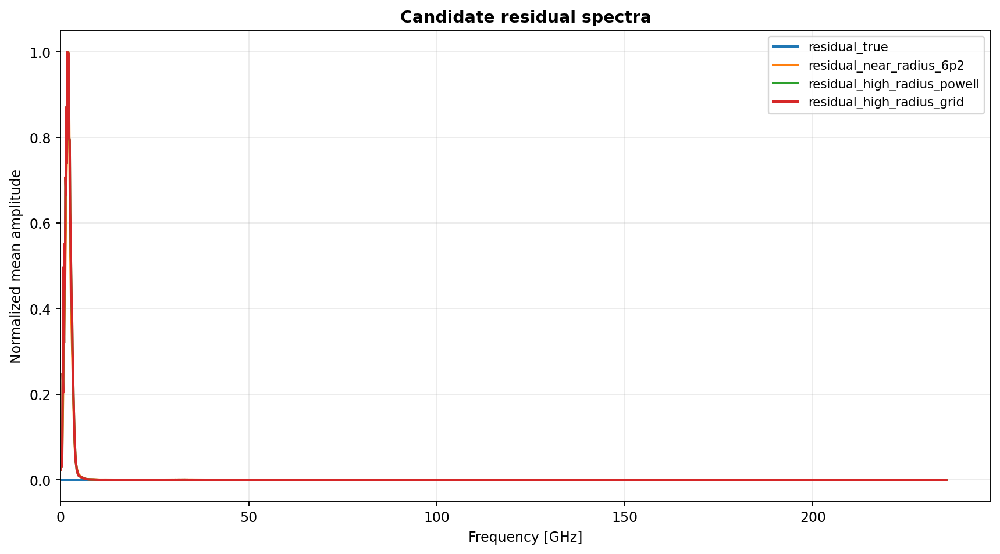<br>
<em><b>Figure 8.</b> Spectrum-design diagnostic: the radius-distinguishing energy contained in each frequency band. The low band emphasized by the staged-bandwidth method is nearly empty of size information, which is why it improves position seeds but not the size estimate (the useful content sits around 1–2.5 GHz).</em>

### 4.3 Does combining two frequencies help? — **No; plain averaging hurts.**
*(WRI cumulative-frequency idea · experiments 038–049)*

Intuition suggests that combining a 1.0 GHz and a 1.5 GHz view should add
information.

**Finding:** the 1.0 GHz signal is roughly 30× *less* sensitive to radius than
the 1.5 GHz signal, so **averaging the two equally roughly halves the radius
"margin"** (the *margin* measures how clearly the best radius beats the next-best
— larger is more confident). The conclusion: frequencies should not be averaged
blindly. We use the size-sensitive band (1.5 GHz), optionally carrying the low
band at only ~25% weight for basin stability.


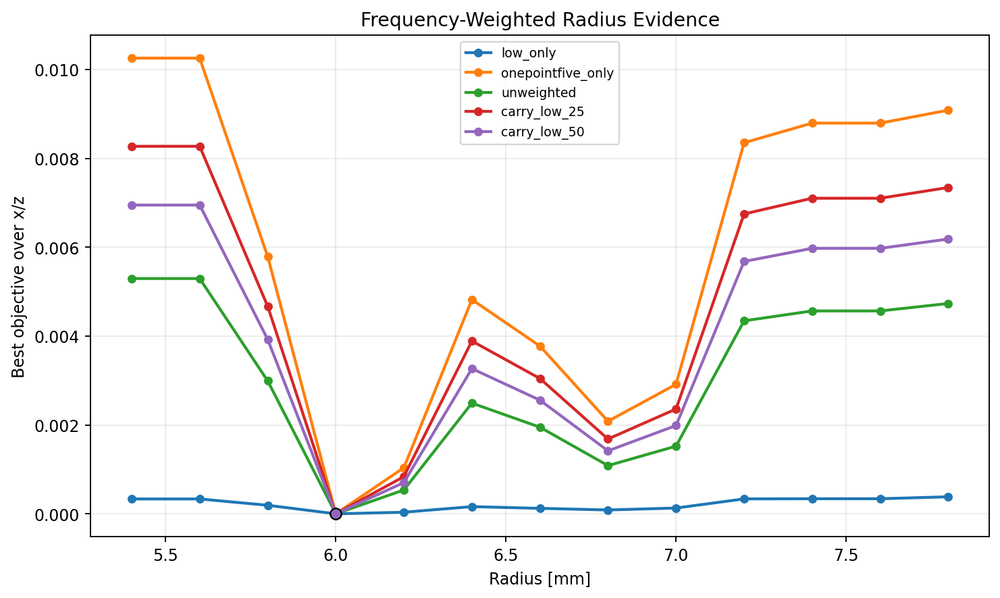<br>
<em><b>Figure 9.</b> Radius-misfit curves under five frequency-weighting schemes. The deepest, cleanest minimum at the true radius is produced by the size-sensitive 1.5 GHz band; equal averaging yields a shallower minimum and dilutes the size evidence.</em>

### 4.4 Does the Wasserstein (W2) distance help? — **Right tool, wrong problem.**
*(Quadratic-W2 strategy · experiments 048–051)*

We first reproduced the paper's headline result: on artificially time-shifted
pulses, the W2 distance is smooth and well-behaved where ordinary least-squares
is oscillatory and trap-prone. **The published claim holds.**

**However,** applied to our actual radius problem the W2 radius signal *collapsed
by four orders of magnitude* (margin 1.06e-7 with W2 vs 1.04e-3 with ordinary
fitting). The reason: W2 requires a normalization step that discards precisely
the *amplitude* detail on which our radius estimate depends. **W2 addresses a
timing problem we do not have and would erase the amplitude problem we do have.**
We therefore reject it for radius selection while retaining it as a basin-finder
for poor initial models.


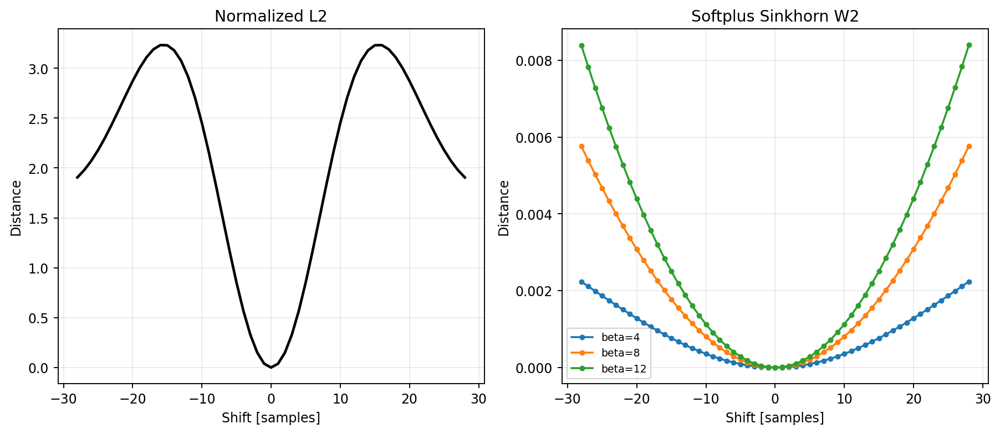<br>
<em><b>Figure 10.</b> Gate 1 (passed): on shifted pulses, ordinary least-squares (left) is oscillatory and contains false minima, whereas the W2 distance (right) is smooth — consistent with the published claim.</em>

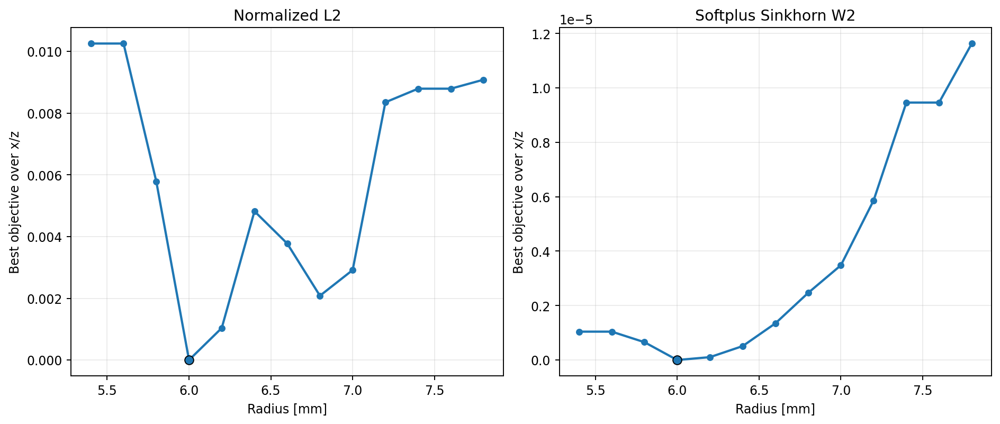<br>
<em><b>Figure 11.</b> Gate 2 (failed for our use): on the real rebar-radius problem, least-squares (left) shows a sharp minimum at the true radius, while W2 (right; note the much smaller vertical scale) is nearly flat and cannot separate sizes — hence its rejection as the radius objective.</em>

### 4.5 Could a wrong material masquerade as a wrong size? — **No.**
*(experiment 056)*

A wrong radius might conceivably hide behind a wrong assumption about the
concrete's properties or the steel's conductivity. We swept those material
properties jointly with radius.

**Finding:** at the correct position, the true radius with the true material wins
cleanly. The concrete property is well-identified; the steel's conductivity
saturates (any "very conductive" value appears equivalent, as expected
physically). **Material does not explain the radius bias**, so we do not add free
material parameters to the size optimizer.


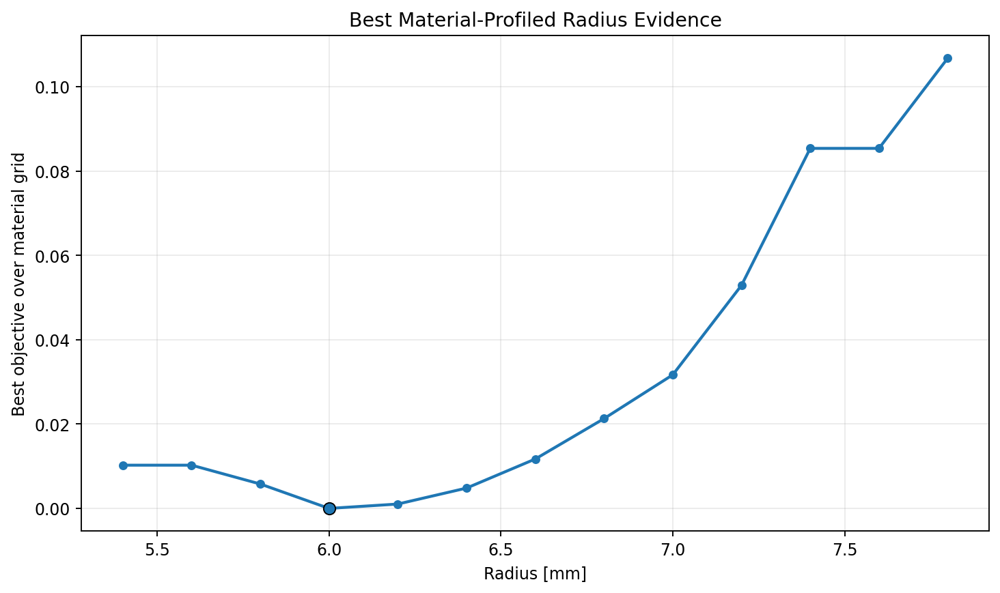<br>
<em><b>Figure 12.</b> Best achievable misfit vs. radius after also optimizing the material properties at each radius. The clean minimum remains at the true radius: a wrong size cannot be compensated by adjusting materials.</em>

### 4.6 The principal finding: an unknown radar pulse shape
*(experiments 052–055)*

On real equipment the emitted radar pulse is never known *exactly* — its
amplitude, precise start-time, and centre frequency all drift. We quantified the
effect of such a mismatch on the size estimate.

**Finding (the failure mode).** A *modest* pulse mismatch corrupts the radius.
With the modelled pulse held fixed and only the observed pulse perturbed:

| Pulse mismatch (observed) | Recovered radius |
|---|---|
| none (nominal) | **6.0 mm** ✓ |
| centre-frequency −10% | 5.4 mm ✗ (hits low bound) |
| centre-frequency +10% | 7.8 mm ✗ (hits high bound) |
| start-time +50 ps | 5.4 mm ✗ |
| start-time −50 ps | 7.8 mm ✗ |
| amplitude +10% | 7.0 mm ✗ |

This failure mode would surface only after moving to real data; exposing it on
synthetics is precisely the value of the study.


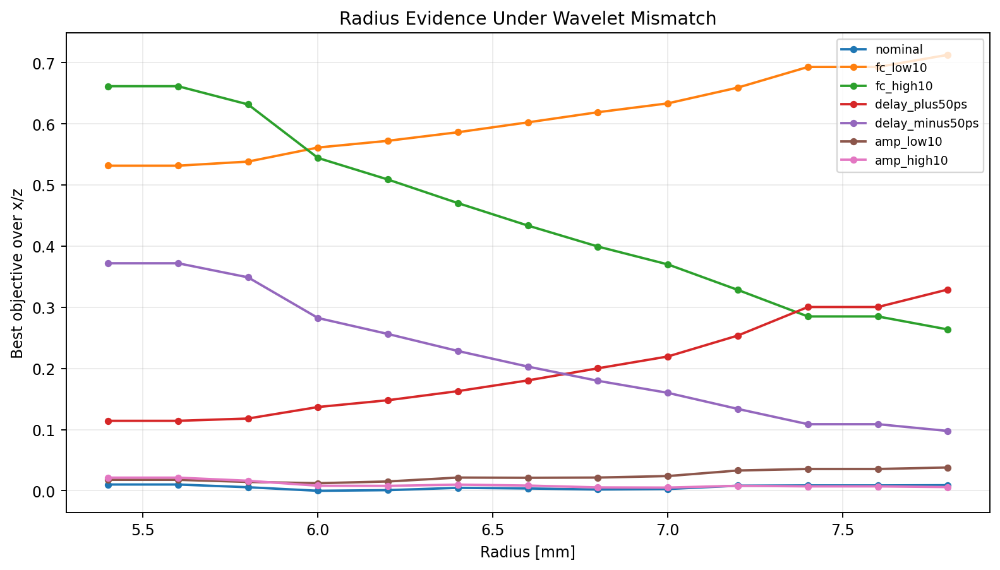<br>
<em><b>Figure 13.</b> Failure mode: each curve corresponds to a different small pulse mismatch. Only the nominal and amplitude cases reach a minimum at the true 6 mm radius; timing and frequency mismatches drive the best radius to the grid boundary.</em>

**The remedy — source profiling.** Rather than assuming the pulse is known,
the algorithm *also* solves for three small pulse nuisance parameters at each
candidate: an **amplitude** scale, a **time-shift**, and a **centre-frequency**
scale. Introduced one at a time, they correct the failure cases one at a time;
with all three enabled, *every* mismatched case recovers the true 6.0 mm radius.
This is the single most important addition in the project.


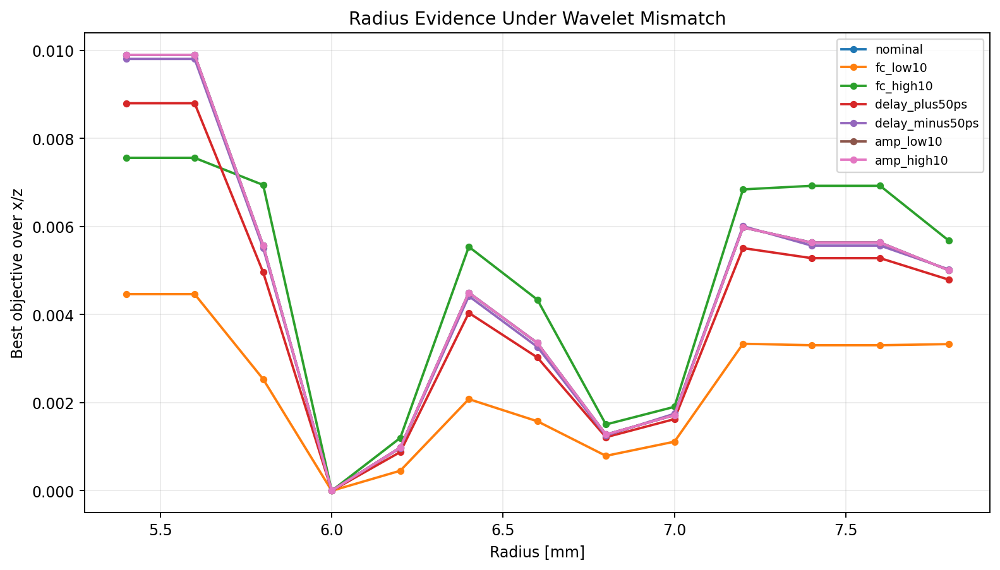<br>
<em><b>Figure 14.</b> The remedy: with the pulse amplitude, timing, and centre-frequency profiled as nuisance parameters, all seven mismatch curves collapse back onto the same clean minimum at the true 6 mm radius.</em>

### 4.7 Synthesis: a source-profiled radius-polish procedure
*(experiments 057–058)*

We assembled every surviving idea into one reusable procedure: scan a small local
grid of candidate (*x, z, r*), and at each candidate solve for the three pulse
nuisances, reporting not only the best radius but the **top candidates and the
margin** (how clearly the winner is separated from the next).

- **Nominal case (057):** recovers *r* = 6.0 mm cleanly.
- **Deliberately mismatched case (058):** still recovers *r* = 6.0 mm **and**
  correctly reports the injected pulse amplitude / time / frequency, confirming
  that size is not absorbing the pulse error.


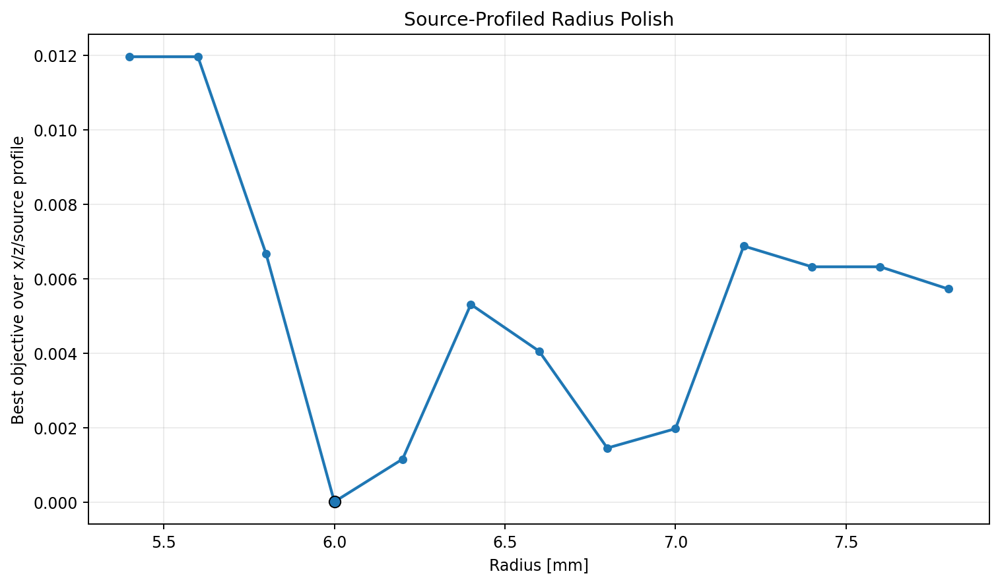<br>
<em><b>Figure 15.</b> The production-style source-profiled polish on a deliberately mismatched case: the true 6 mm radius wins, and the recovered pulse nuisances match those injected. Position is exact and size is correct with a real margin.</em>

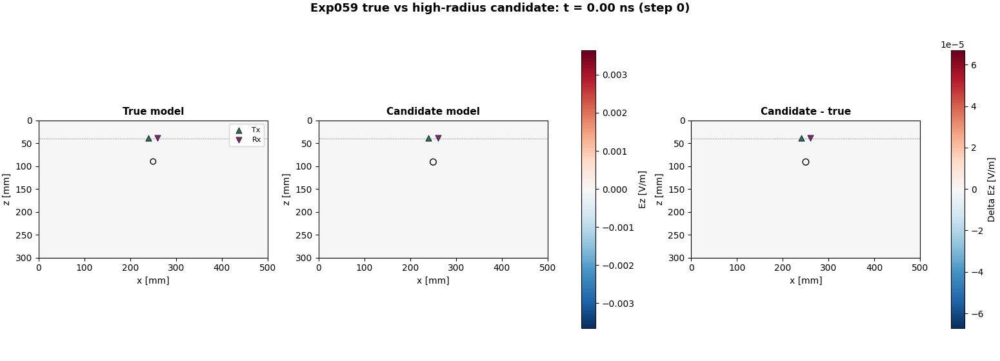<br>
<em><b>Figure 16.</b> Why the size question is subtle: the true-radius bar (one wavefield) and a too-thick candidate (the other) produce echoes that are nearly identical. Distinguishing them is exactly the task of the source-profiled polish and margin reporting.</em>

**Outcome of the five-strategy study** — a hierarchy of usefulness for *our*
problem:

```
Strongly useful:   source-pulse profiling (amplitude + time + frequency)
                   frequency weighting toward the size-sensitive band
                   staged bandwidth — but only as a position-seed builder

Useful as diagnostic only:   the cycle-skipping / trace-shift detector
                             the W2 distance (confirms the shift claim)

Rejected for this problem:   W2 as the radius objective
                             blind multi-frequency averaging
                             free material parameters in the size optimizer
                             full WRI solver and full neural IFWI (deferred)
```


## 5. Multi-rebar inversion and uncertainty-aware reporting
*(experiments 063–106)*

The next milestone introduced more than one bar (the realistic case, since rebar
is installed in grids). We proceeded up a deliberate ladder:

1. **A single shared radius** for three bars — recovered cleanly.
2. **Each bar's radius independently** — still correct, but with thinner
   confidence margins (neighbouring bars interfere).
3. **Each bar's full position and radius locally** — correct for the left, centre,
   and right bars under 10% noise and pulse mismatch, again with thin margins.

The thin margins prompted the most important methodological change in the
project:

> **We no longer report a single radius value. Every result carries a confidence
> label (strong / moderate / weak) and an "ambiguity interval" — the range of
> radii the data cannot rule out.**

Across a 24-case replication over several noise realizations, the pipeline
recovered the true position and radius in **all 24 cases**, but honestly labelled
**22 as "weak" confidence** and 2 as "moderate". This is not a deficiency — it is
the pipeline declining to overstate precision. We then built a **reporting-first
coordinate optimizer** that tunes one bar at a time within guarded windows, with
a **guarded-revisit** step that returns to rescue any bar that initially fell
into the too-thick trap once its neighbours are constrained.


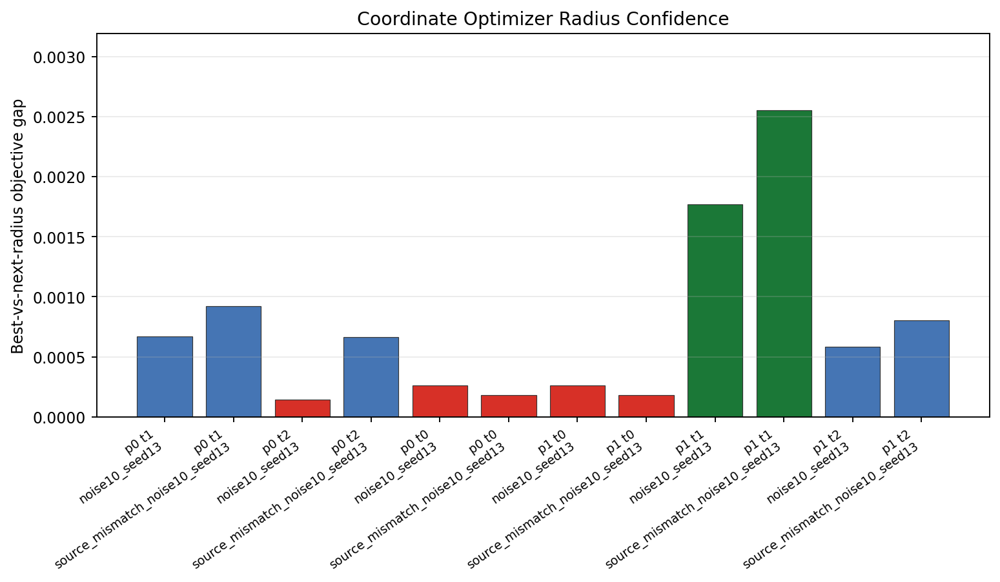<br>
<em><b>Figure 17.</b> Multi-bar confidence reporting: per-target radius margins with strong / moderate / weak labels. The point estimates are correct; the role of this figure is to convey *how confident* each one is — uncertainty is a first-class output, not an afterthought.</em>

## 6. An end-to-end detection-to-inversion pipeline
*(experiments 107–201)*

To this point the refinement was *given* an approximate location. The next
milestone removed that assumption and added a front end that begins from the raw
B-scan, with no prior knowledge of the bars' positions.

**6a. A detector.** It removes the B-scan background, converts the result to an
"energy" image, and scores how well a bar at each candidate position would
explain the hyperbola arcs. One subtlety it revealed: the pulse start-time delay
must be accounted for, or every bar appears too deep. On a 48-scenario sweep
(depths 70–130 mm, radii 4–10 mm, up to 10% noise — and again under pulse
mismatch), the detector located the bar in **48 of 48** cases.


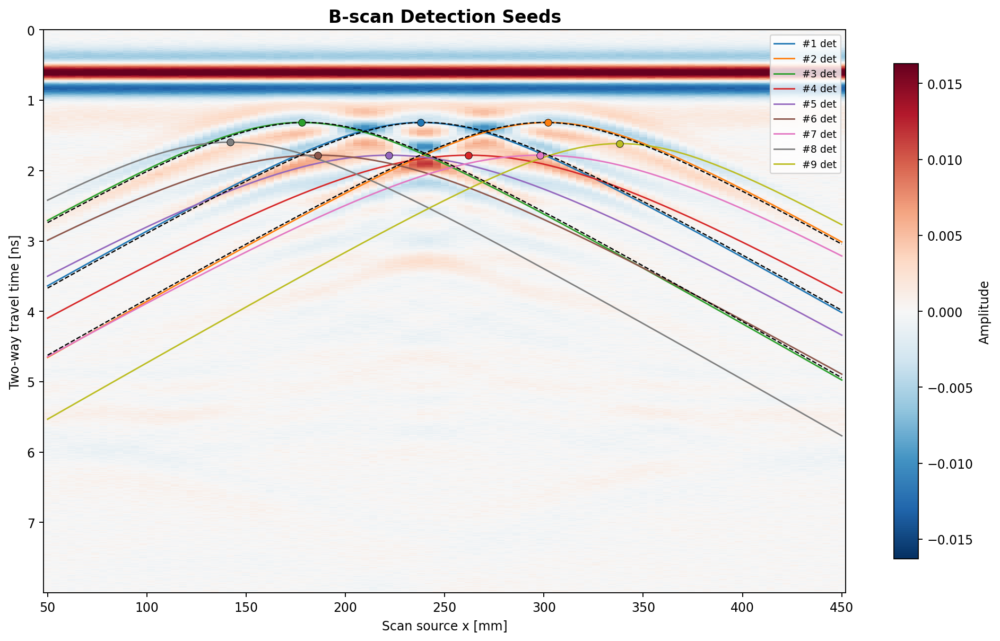<br>
<em><b>Figure 18.</b> The detector operating on three closely-spaced bars under 10% noise and pulse mismatch, with no prior knowledge of their locations. The marked peaks are the seed windows it passes to the refinement stage.</em>

**6b. A two-stage refinement.** Running the full fine search on every detector
hit is too costly, so we use a **coarse screen ➜ narrow polish**: a quick 2 mm
screen discards poor windows, and the expensive 1 mm source-profiled polish runs
only on survivors. This **reduced runtime by ~55%** (≈1060 s ➜ ≈479 s) with the
*same* final answer. An optional final **guarded-polish** stage performs a
high-quality local check.

**6c. A documented limit — shallow, thin bars.** A shallow 4 mm bar under pulse
mismatch plus 10% noise is the hardest case. The pipeline recovers its position
and radius **exactly across multiple noise realizations**, but the size margin is
genuinely thin: the data support a small *interval* (about 3.9–4.0 mm), not a
single sharp value. We traced part of this to unavoidable **grid rasterization**
(4.0 and 4.1 mm can occupy identical cells), which sub-cell geometry and a finer
grid partly relieve. The correct scientific report is the interval.

**6d. The strongest new lever — higher radar bandwidth.** Mild post-hoc
reweighting helped little, but *acquiring* a higher-frequency band (2.5 GHz)
genuinely sharpened size confidence: for the deep 8 mm bar it **collapsed the
uncertainty interval to a single value** across three noise realizations, and it
also strengthened the shallow 4 mm case. This motivates a **progressive-bandwidth
pipeline**: low/mid frequencies for detection and location, a dedicated
high-frequency band for final size confidence. We keep the bands explicitly
separated so that the report never implies the low-frequency data contained
high-frequency information.


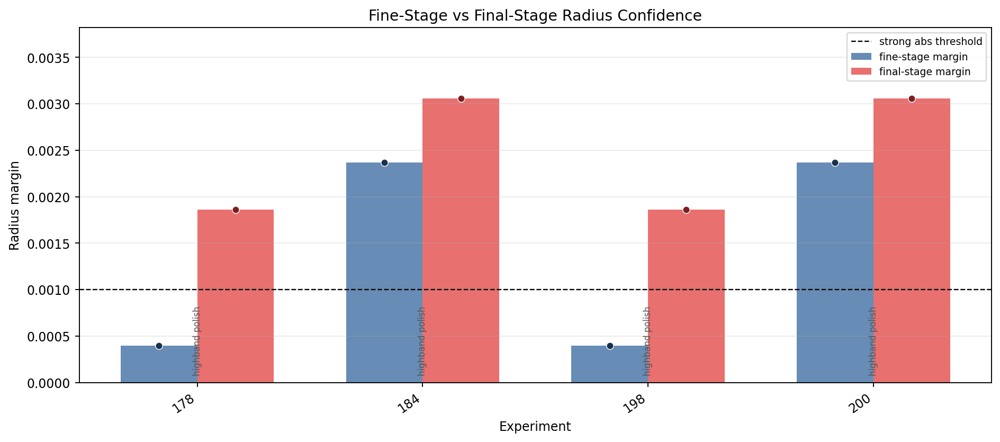<br>
<em><b>Figure 19.</b> Per-stage confidence across the packaged detection-to-inversion pipeline for the shallow 4 mm and deep 8 mm bars. The high-frequency stage upgrades size confidence (decisively for the 8 mm bar) while keeping the point estimates exact, and weak cases remain honestly labelled.</em>

## 7. Current work: variable-radius, closely-spaced targets
*(experiments 202–276)*

The active research line is the realistic and demanding case: **three bars of
*different* sizes (5, 6, 8 mm) packed closely together.** This stresses the method
on every front, because the bars interfere and a wrong size on one can mask a
wrong position on another.

The key discovery concerns **ordering**. A naive "tune every parameter of every
bar at once" search fails — it inflates the small bars. We diagnosed the cause
with a controlled oracle test:

- With each bar's *position fixed to truth*, a joint search over the size-triple
  **ranks the true (5, 6, 8) first.** The size objective is therefore sound.
- With positions fixed to the *detector's* (slightly inaccurate) seeds, the same
  search **fails** and prefers inflated sizes.

**Conclusion: positions must be corrected *before* sizes are estimated.** This
produced the current **staged policy**, which mirrors the published
"low-dimensional updates first" philosophy:

```
1. Detect bars in the B-scan                    (find candidates)
2. Assign one clean seed per physical bar       (reject duplicate/ghost hits)
3. Location-only pass, radii held fixed          (lock x/z without size cheating)
4. Focused position+size polish on hard bars     (rescue the deep/large bar)
5. Joint radius estimation at the fixed grid      (read off the size-triple)
```

This recovers the true sizes across multiple noise realizations. What remains is
a narrow, honestly-reported **lateral (sideways-x) ambiguity** when bars are very
close: in some cases the data cannot distinguish 309 from 310 mm for a bar.


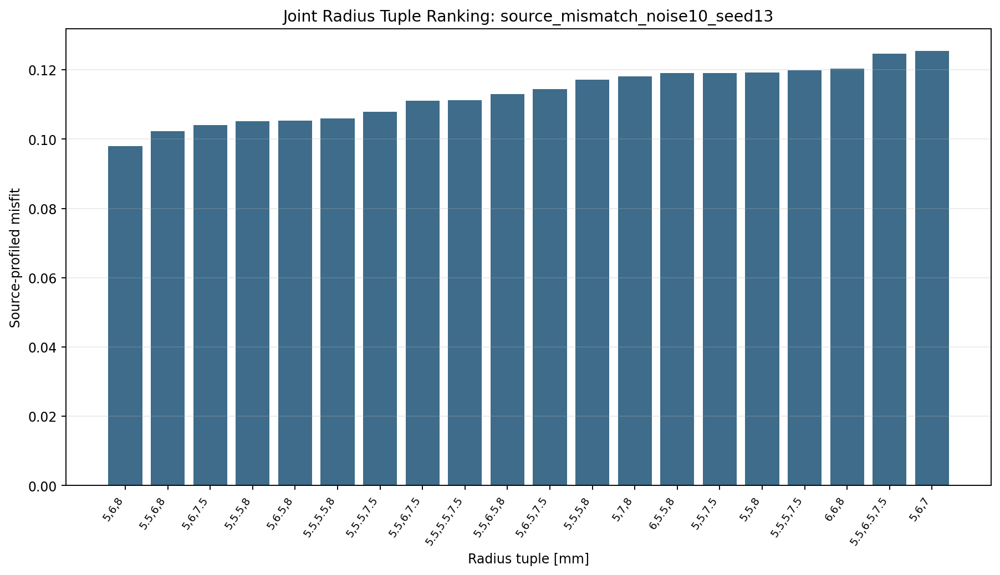<br>
<em><b>Figure 20.</b> Oracle test (positions = truth): the joint size search ranks the true (5, 6, 8) mm triple first, confirming that the size objective itself is sound.</em>

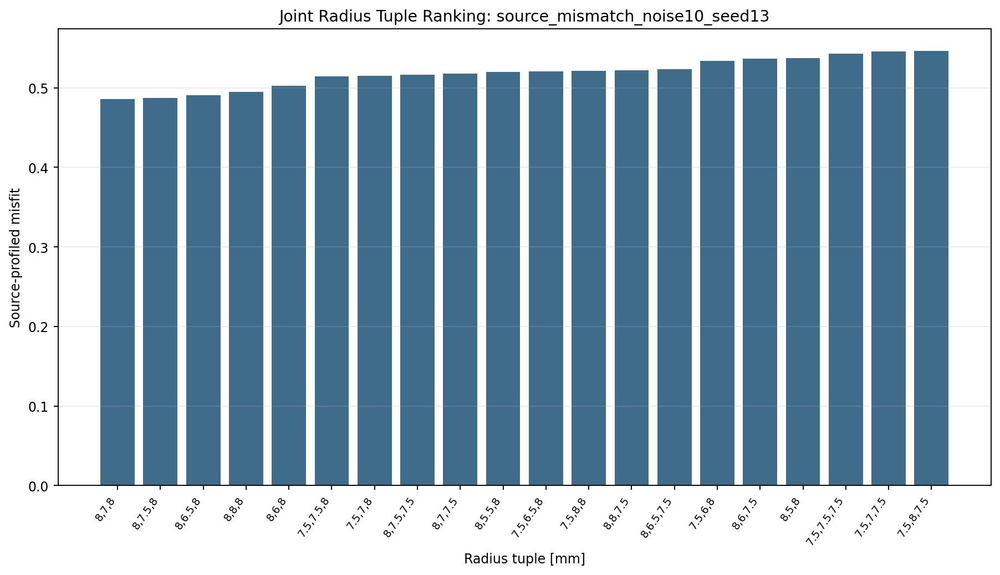<br>
<em><b>Figure 21.</b> The same search at the detector's slightly-inaccurate positions: it now prefers inflated sizes and misses the truth. This is the evidence that *position must be fixed before size*, and the reason the pipeline is staged.</em>

**Lateral ambiguity and acquisition design.** Resolving the residual lateral
ambiguity became a study of the *measurement setup itself* as the tuning
parameter:

- **More scan positions help** — increasing from 5 to 7 to 9 antenna positions
  collapses the lateral ambiguity at 60 mm bar spacing.
- **The effect is spacing-dependent** — at a tighter 50 mm spacing, even 9
  positions do not fully resolve it under the current settings.
- **Antenna geometry is the strongest lever** — widening the transmitter–receiver
  offset from 20 mm to 40 mm cleanly separated the tight 50 mm case, replicated
  across three noise realizations.

A deliberate methodological point: we declined to "resolve" the ambiguity by
quietly loosening the confidence threshold. When the data genuinely do not
support a single lateral position, we report an interval and instead seek a
*physical* lever (more positions, wider antenna offset) that adds real
information.


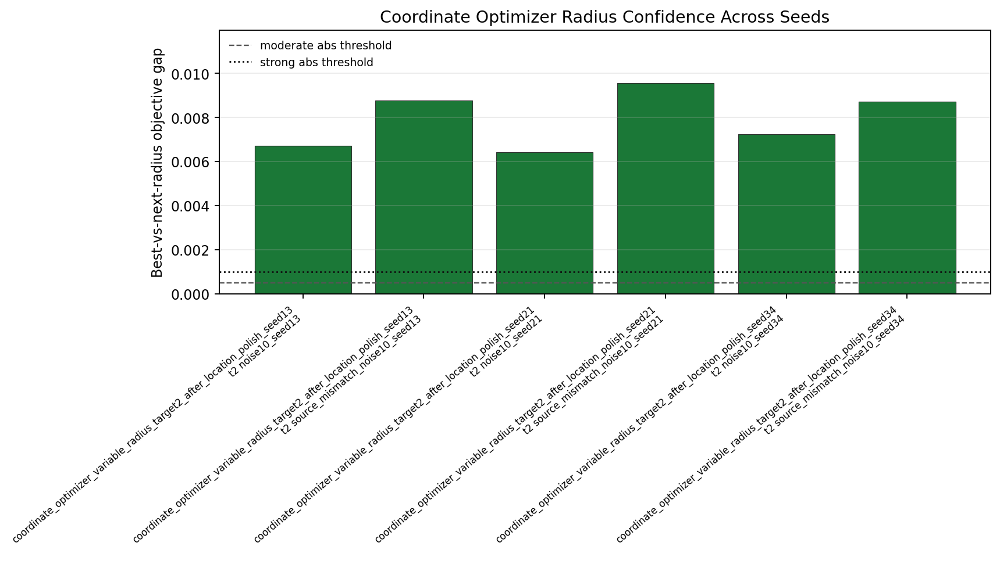<br>
<em><b>Figure 22.</b> Variable-radius results aggregated across three noise realizations: radius and depth confidence for the hardest (deep, large) bar are strong, while the lateral-position column is reported as an interval until a physical acquisition lever (more positions or a wider antenna offset) closes it.</em>

## 8. Current status: capabilities and limitations

**Established / robust (on 2-D synthetic data):**
- **Position and depth** of bars are recovered accurately and repeatably, even
  with 10% noise, an unknown radar pulse, and several interfering bars.
- **Unknown pulse shape** — formerly the dominant risk to size — is handled by
  profiling three small pulse nuisance parameters.
- **Detection from scratch** is reliable (48/48 on the benchmark sweep; multiple
  same-depth, variable-depth, and closely-spaced bars).
- **Multi-bar coordinate inversion** works on three scene types: same-depth,
  closely-spaced, and variable-depth.
- **Uncertainty is reported honestly** — confidence labels and ambiguity
  intervals are mandatory outputs.

**Open / known limitations:**
- **Size of shallow, thin bars** is an *interval*, not a single value, under
  noise plus pulse mismatch. Part of this is fundamental grid rasterization; a
  higher-frequency acquisition is the most promising remedy.
- **Lateral position at very tight spacing** (≤50 mm) can be ambiguous; the
  remedy is acquisition design (antenna offset, more positions), not a software
  threshold adjustment.
- **All results are synthetic and 2-D.** No laboratory or field data yet; 3-D is
  deliberately outside the current scope.

**Evaluated and deliberately set aside (with evidence):** the W2 distance as a
size objective; blind multi-frequency averaging; free material parameters in the
size optimizer; and an early-reflection objective. **Deferred (not rejected):**
the heavier WRI solver and the neural-IFWI approach, both reserved for the point
at which explicit nuisance parameters become insufficient (for example, real
field data).


## 9. Computational cost and hardware

All forward simulations and inversions in this campaign were executed on an
**NVIDIA DGX Spark** workstation built on the **GB10 Grace–Blackwell**
superchip. The defining feature for this work is its **128 GB of unified,
CPU–GPU-coherent memory**: the adjoint method must store the full forward
wavefield history (≈ 760 MB for the baseline model, and several times that at the
finer grids used for radius studies), and unified memory allows these histories
and large candidate batches to reside in memory without host–device staging.

### 9.1 Hardware

| Component | Specification |
|---|---|
| Platform | NVIDIA DGX Spark (GB10 Grace–Blackwell superchip) |
| GPU | Blackwell-generation, ≈ 6,144 CUDA cores, 5th-gen Tensor Cores |
| CPU | 20-core Arm (10× Cortex-X925 + 10× Cortex-A725), NVLink-C2C to GPU |
| Memory | 128 GB unified LPDDR5X (CPU + GPU coherent), ≈ 273 GB/s bandwidth |
| AI throughput | up to ≈ 1 PFLOP (FP4, sparse) |
| Software | CUDA 13.0, CuPy 14.0.1 |

*GPU-internal figures (CUDA cores, Tensor Cores, memory bandwidth, FP4
throughput) are per NVIDIA's published DGX Spark / GB10 specifications; the
128 GB unified memory, CUDA 13.0, and CuPy 14.0.1 are from our run environment.*

### 9.2 The forward model and per-B-scan cost

The baseline forward model is a **280 × 180-cell** grid (≈ 50,000 cells,
including a 15-cell CPML absorbing layer), with **≈ 1,887 time steps** at
Δt ≈ 4.24 ps, 2 mm cells, and a 1.5 GHz Ricker source over a 500 mm × 300 mm
domain. A complete **B-scan** stacks one forward solve per transmit position.

Measured across our source-profiled sweeps, a single full B-scan at the
production 2 mm grid — **5 transmit positions, one frequency band** — costs
**≈ 5 s** on the GB10, i.e. **≈ 1 s per transmit position**. For example,
experiment 057 evaluated 12 such B-scans in 58.8 s (≈ 4.9 s each), and
experiment 058 evaluated 156 candidate × source-scale B-scans in 771.0 s
(≈ 4.94 s each). Cost scales linearly with the number of transmit positions and
frequency bands (a 1.0 + 1.5 GHz evaluation is ≈ 2× a single band) and with grid
refinement (a 1 mm grid costs ≈ 4× a 2 mm grid per solve, and 0.5 mm ≈ 8×, owing
to the additional cells and time steps). As a lower-level reference, the GPU
field-update kernels alone run at ≈ 0.10 s per 500 steps at this grid size
(3.2× the CPU, rising to ~7× near 0.8M cells; Figure 7); the ≈ 1 s per-position
figure is the full end-to-end cost, including CPML, source injection, receiver
gather, and objective filtering.

### 9.3 Why experiments are expensive — and how we contain the cost

The campaign's longer runtimes come from *deliberate sweeps*, not from a single
slow simulation. Each refinement scans a grid of candidate (*x, z, r*)
geometries, and at every candidate fits a small grid of source-pulse nuisances
(amplitude / time-shift / centre-frequency) and, where used, multiple frequencies
and several independent noise realizations. Representative *measured* runtimes:

| Operation | Setting | Scale | Wall time |
|---|---|---|---:|
| **Full B-scan (5 positions, 1 band)** | **1 mm grid, measured (exp 057/058)** | **1 B-scan** | **≈ 5 s** |
| GPU field-update kernels only (reference) | 50K cells, 500 steps | — | 0.10 s |
| Coarse screen | 2 mm grid, run 118, 5 positions | 77 candidates | 282 s |
| Fine polish | 1 mm grid, run 118, 5 positions, 1.5 GHz | 15 candidates | 247 s |
| Packaged detect ➜ coarse ➜ fine | run 118, end-to-end | — | 546 s |
| Direct 1 mm source-profiled grid | run 111 | 66 candidates | 1061 s |
| Two-stage coarse ➜ fine (same answer) | runs 116–117 | 66 + 15 | 479 s (≈ 55% faster) |
| 0.5 mm verification smoke | run 146, 3 positions | 3 radii | 373 s |

Three observations follow:

1. **Grid resolution dominates per-candidate cost.** A 1 mm fine-grid candidate
   costs ≈ 4× a 2 mm coarse-grid candidate (more cells *and* more time steps).
   This is exactly why the pipeline screens on a coarse grid first and reserves
   the fine grid for survivors; the two-stage design preserves the final answer
   while cutting wall time ~55%.
2. **Sub-millimetre grids are reserved for verification.** The 0.5 mm grid — used
   only to confirm that the residual radius ambiguity is partly grid
   rasterization rather than physics — costs ~373 s for just three radii at three
   sources, which is why it is not the default.
3. **Unified memory is the enabler.** Candidate B-scans are batched on the GPU,
   and the full adjoint field history fits in memory without host transfers,
   which is what makes a ~276-experiment, sweep-style campaign practical on a
   single workstation.


## 10. Ongoing and future work

1. **Treat acquisition design as a first-class parameter.** Our clearest recent
   gains came from *how we measure* (a high-frequency band, antenna offset, the
   number of scan positions) rather than from more elaborate post-processing. We
   are formalizing a **progressive-bandwidth-plus-geometry recipe**: low/mid band
   to detect and locate, high band and a wider antenna offset for final size and
   lateral confidence.

2. **Package the staged pipeline into one reproducible workflow.** The
   detect ➜ assign ➜ locate ➜ focus ➜ size chain currently spans several scripts.
   We are consolidating it into a single orchestrated runner that always emits
   the confidence labels, intervals, runtimes, and validated figures.

3. **Harden the uncertainty reporting.** We are calibrating the
   weak/moderate/strong thresholds against a realistic noise model so the
   reported intervals are not merely conservative but correct.

4. **Advance toward realism.** Subsequent stages target laboratory or field data,
   more varied geometries (corrosion, coatings, non-circular bars), and — only
   when explicit nuisance parameters become insufficient — the deferred WRI and
   neural-IFWI branches. The standing objective is a publishable result: *a
   source-profiled, confidence-aware 2-D GPR-FWI pipeline for rebar location and
   size with explicit ambiguity reporting under noise, pulse mismatch, and
   multi-bar interference.*


## 11. Experimental campaign summary

| Milestone | Objective | Experiment range | Count\* |
|---|---|---|---|
| **M0 — Framework** | Forward solver + inverse solver + GPU; recover three bars | pre-numbered (`outputs/figures/`) | — |
| **M1 — Baseline** | One bar: recover position + radius on clean data | 001–023 | ~23 |
| **M2 — Five-strategy study** | Identify what truly moves radius ➜ source profiling | 024–062 | ~39 |
| **M3 — Multi-bar + confidence** | Several bars; uncertainty as a first-class output | 063–106 | ~44 |
| **M4 — Detection ➜ inversion pipeline** | Locate bars from scratch; high-band size confidence | 107–201 | ~95 |
| **M5 — Variable-radius frontier (current)** | Differently-sized, closely-spaced bars; acquisition design | 202–276 | ~75 |

\*Numbered output folders, approximate per range.

**Category totals** (from the experiment index):

| Category | Description | Count |
|---|---|---|
| Single rebar | one bar; radius, depth, pulse, bandwidth, material, polish studies | **122** |
| Multi rebar | several bars; coupling, confidence, coordinate optimizer | **80** |
| Infrastructure / reporting | plotting, aggregation, CLI, summary runs (no new physics) | **73** |

The repository also contains **47** written experiment logs
(`docs/experiments/`), the **5** guiding strategy papers (`docs/papers/`), and on
the order of **500+ figures and ~50 animations** across the experiment folders. A
by-category browsing view is provided at
`outputs/experiments/_by_category_symlinks/`.


## 12. Glossary

- **GPR — Ground-Penetrating Radar.** A surface antenna that emits radio-frequency
  pulses into a material and records the echoes.
- **Rebar.** Steel reinforcing bar inside concrete. Our targets are circular in
  cross-section; "radius" is half the diameter.
- **B-scan.** The radar image: echo strength vs. antenna position (horizontal) and
  travel-time (vertical). Buried bars appear as hyperbola (arch) shapes.
- **FDTD — Finite-Difference Time-Domain.** The forward physics solver: simulate
  EM waves by advancing a fine space–time grid via Maxwell's equations.
- **Yee grid / leapfrog.** The standard arrangement and alternating update order
  of the electric/magnetic fields in FDTD.
- **TMz polarization (Ez, Hx, Hy).** The 2-D field configuration we simulate.
- **CPML.** A specialized absorbing layer at the grid edges that prevents outgoing
  waves from reflecting back, emulating an unbounded medium.
- **FWI — Full-Waveform Inversion.** The inverse solver: adjust a model until its
  simulated B-scan matches the measured one, fitting the *entire* waveform.
- **Adjoint-state method.** The efficient route to the model-update direction
  (gradient) using two simulations per iteration — a forward run plus a backward
  run of the residual mismatch. The same principle as neural-network
  backpropagation.
- **Objective / misfit / NRMS.** Measures of how wrong the current model is.
  **NRMS** = Normalized Root-Mean-Square error (0 = perfect). Lower is better.
- **Margin.** How clearly the best candidate is separated from the next-best
  distinct one. A large margin indicates confidence; a small margin indicates
  ambiguity.
- **Ambiguity interval.** The range of values (e.g. radii) the data cannot rule
  out — reported in place of a falsely precise single value.
- **Cycle-skipping.** The classic FWI trap of aligning a wave oscillation with the
  wrong neighbouring oscillation and confidently optimizing toward a wrong model.
- **Optimal transport / Wasserstein (W2).** A distance measuring how much "work"
  it takes to slide one signal onto another; robust to timing shifts but
  discards amplitude detail.
- **PEBDD.** Progressively Expanded Bandwidth: fit a narrow low band first, then
  widen in stages.
- **WRI.** Wavefield Reconstruction Inversion: a relaxed FWI variant; we adopted
  its cumulative-frequency idea, not its full solver.
- **IFWI.** Implicit FWI: represent the material map with a small neural network;
  deferred here.
- **Source / wavelet profiling.** Solving for the radar pulse's unknown amplitude,
  start-time, and centre-frequency as small nuisance parameters, so that a wrong
  pulse cannot corrupt the size estimate.
- **Grid rasterization.** Drawing a small circle on a finite grid: two close radii
  can occupy identical cells, so the physics cannot separate them.
- **Guarded revisit / guarded polish.** Returning to rescue a bar that fell into
  the too-thick trap, or a final high-quality local check, after neighbours are
  constrained.
- **DGX Spark / GB10.** The NVIDIA Grace–Blackwell platform on which this campaign
  runs (every simulation executes on the GPU).

---

*All figures and animations in this report are embedded; the underlying
experiment outputs are archived under `outputs/experiments/`.*
